In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader 
from torch.autograd import Variable
from torch.backends import cudnn


import matplotlib.pyplot as plt
import os
from PIL import Image
import cv2
import numpy as np


# Augmenting library 

import torchvision
import torchvision.transforms.functional as TF
import albumentations as A
import torchvision.transforms as T

# Control Randomness
import random
random_seed = 7
torch.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)
random.seed(random_seed)

import warnings
warnings.filterwarnings("ignore")
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "2, 3"
print(torch.cuda.device_count())


# logging
import datetime
from tensorboardX import SummaryWriter
from tqdm import tqdm
import time 

/home/sklab2/anaconda3/envs/vessel2/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2


In [2]:
import joint_transforms
from config import cod_training_root
from config import backbone_path
from datasets import ImageFolder
from misc import AvgMeter, check_mkdir
from PFNet import PFNet
from helper import *
import loss

# Config

In [3]:
ckpt_path = './ckpt'
exp_name = 'PFNet'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args = {
    'epoch_num': 300,
    'train_batch_size': 32,
    'last_epoch': 0,
    'lr': 5e-4, 
    'lr_decay': 0.9,
    'weight_decay': 5e-4,
    'momentum': 0.9,
    'snapshot': '',
    'scale': 416, 
    'save_point': [],
    'poly_train': False,
    'optimizer': 'Adam',
    'amp' : False
}

In [4]:
# loss function
structure_loss = loss.structure_loss().to(device)
bce_loss = nn.BCEWithLogitsLoss().to(device)
iou_loss = loss.IOU().to(device)

In [5]:
def bce_iou_loss(pred, target):
    bce_out = bce_loss(pred, target)
    iou_out = iou_loss(pred, target)
    loss = bce_out + iou_out
    return loss

# Net

In [6]:
net = PFNet(backbone_path)

From ./backbone/resnet/resnet50-19c8e357.pth Load resnet50 Weights Succeed!


In [7]:
from torch.optim.lr_scheduler import ReduceLROnPlateau



if args['optimizer'] == 'SGD':
    print('SGD opt')
    optimizer = torch.optim.SGD([
        {'params': [param for name, param in net.named_parameters() if name[-4:] == 'bias'],
        'lr': 2 * args['lr']},
        {'params': [param for name, param in net.named_parameters() if name[-4:] != 'bias'],
        'lr': 1 * args['lr'], 'weight_decay': args['weight_decay']}
    ], momentum=args['momentum'])

else:
    print('Adam opt')
    optimizer = torch.optim.Adam([
        {'params': [param for name, param in net.named_parameters() if name[-4:] == 'bias'],
            'lr': 2 * args['lr']},
        {'params': [param for name, param in net.named_parameters() if name[-4:] != 'bias'],
            'lr': 1 * args['lr'], 'weight_decay': args['weight_decay']}
    ])

# scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=20, \
#                                 threshold=0.05, threshold_mode='rel', cooldown=5, min_lr = 1e-4)

scheduler = CosineAnnealingWarmupRestarts(optimizer, first_cycle_steps=50, cycle_mult=1.0, max_lr=0.01, min_lr=1e-4, warmup_steps=5, gamma=0.5)

Adam opt


## making data index list

In [8]:
mask_files = os.walk("/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/masked")
mask_idx = []
for (root, dirs, files) in mask_files:
    if len(files) > 0 :
        mask_idx.append(files)

mask_idxs = [element for array in mask_idx for element in array]
len(mask_idxs)

1691

In [9]:
# 1~ 11 / 12, 13, 14  , 40, 41, 43, 44, 46, 49,  50, 53, 54, 55 
train_indexs = []
test_indexs = []
for idx, data in enumerate(mask_idxs):
    tmp = mask_idxs[idx].split('_')
    if len(tmp) < 3:
        if int(tmp[0]) < 45:
            train_indexs.append([ tmp[0], tmp[1].split('.')[0]])
        else:
            test_indexs.append([tmp[0], tmp[1].split('.')[0]])

In [10]:
len(train_indexs) , len(test_indexs)

(1319, 355)

# Dataloader

In [11]:
import albumentations.augmentations.functional as AF

PATH = '/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/'
class VesselDataset(Dataset):
    def __init__(self, index, transforms):
        self.index = index
        self.transforms = transforms
        
    def __len__(self):
        return len(self.index)
        
    def __getitem__(self, idx):
        s_1 = self.index[idx][0]
        s_2 = self.index[idx][1]

        # '1_L_0.jpg', 
        image = Image.open(PATH+'origin/' + s_1+'_L_'+s_2+'.jpg').resize((416, 416),Image.Resampling.NEAREST)
        #'10_L_112_L.png', 
        mask = Image.open(PATH+'masked/' +  s_1+'_'+s_2+'.png').resize((416, 416),Image.Resampling.NEAREST)
        
        image = np.array(image, dtype=np.uint8) #RGB
        mask = np.array(mask, dtype=np.uint8)   # HWC
        mask_o = mask / 255        # CHW

        lower_red = np.array([-10, 100, 100]) 
        upper_red = np.array([10, 255, 255]) 

        mask_hsv = cv2.cvtColor(mask, cv2.COLOR_RGB2HSV)
        mask = cv2.inRange(mask_hsv, lower_red, upper_red)

        aft_mask = mask / 255
        
        # aft_mask = cv2.resize(aft_mask, (416, 416), interpolation=cv2.INTER_NEAREST)
        masks = [aft_mask, mask_o]  # target, original

        # for num in range(3): #### 3번 이터레이션이 왜들어갔지?
        if self.transforms:
            transformed = self.transforms(image=image, masks=masks)
            image, masks = transformed['image'], transformed['masks']
        # urls.append(s_1+'_'+s_2)
        # assert sum(masks[0]==0).sum() + sum(masks[0]==1).sum() == 416*416*args['Tra']   # mask가 0 또는 1이 아닐경우 스탑
                    
        return image, masks, aft_mask, s_1+'_'+s_2

In [12]:
import albumentations.pytorch as AP

train_transform = A.Compose([
    A.RandomRotate90(p=0.3),
    A.HorizontalFlip(p=0.3),
    # A.OneOf([
    #     A.OpticalDistortion(),
    #     A.GridDistortion(),
    #     A.ElasticTransform(),
    #     ], p = 0.3),
    # A.OneOf([
    #     A.CLAHE(clip_limit=2),
    #     A.RandomBrightnessContrast(),
    #     ], p = 0.3),
    # A.Normalize(mean=(126.8661, 126.8530, 127.0134), std = (32.9434, 33.0122, 32.9186)),
    AP.ToTensorV2(always_apply=True)
])

test_transform = A.Compose([
    AP.ToTensorV2(always_apply=True)
])

# tensor([127.5388, 127.5482, 127.6733])
# tensor([57.4250, 57.6999, 57.5387])
train_dataset = VesselDataset(index=train_indexs, transforms=train_transform)
test_dataset = VesselDataset(index=test_indexs, transforms=test_transform)
 
#train_dataset, _, test_dataset = torch.utils.data.random_split(dataset, [train, 0, test])

train_loader = DataLoader(dataset=train_dataset, batch_size=args['train_batch_size'], shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

image, masks, aft_mask, _= next(iter(train_loader))
print(image.shape, masks[0].shape, masks[1].shape, aft_mask.shape)

torch.Size([32, 3, 416, 416]) torch.Size([32, 416, 416]) torch.Size([32, 416, 416, 3]) torch.Size([32, 416, 416])


In [13]:
(masks[0][0] == 0).sum()

tensor(156873)

In [14]:
(masks[0][0] == 0).sum() + (masks[0][0] == 1).sum()

tensor(173056)

In [15]:
416*416*32

5537792

In [16]:
sum(masks[0]==0).sum() + sum(masks[0]==1).sum()

tensor(5537792)

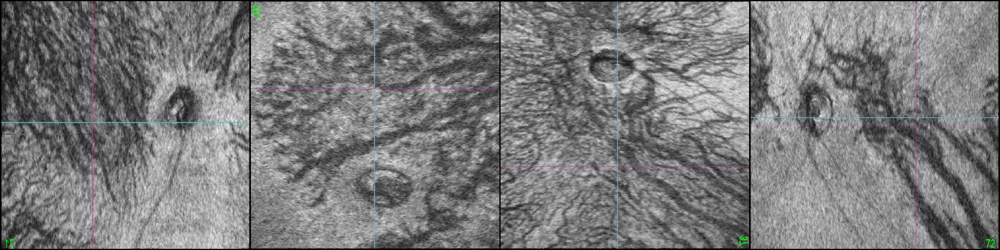

In [17]:
TF.to_pil_image(torchvision.utils.make_grid(image[:4]))

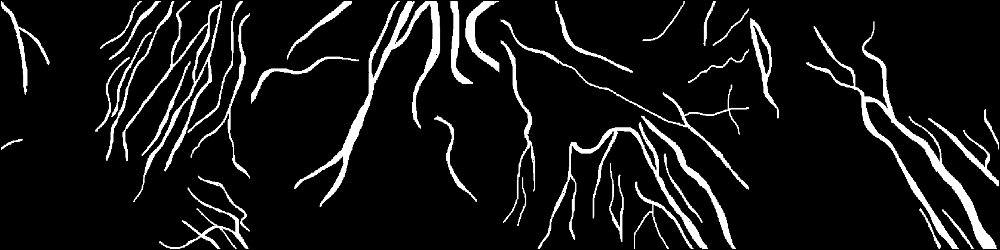

In [18]:
TF.to_pil_image(torchvision.utils.make_grid(aft_mask[:4].unsqueeze(1).expand(4, 3, 416, 416)))

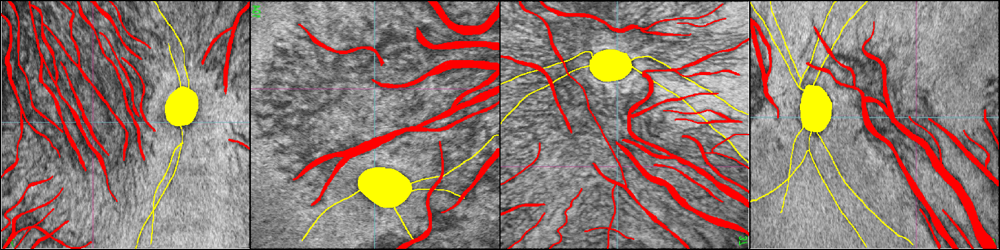

In [19]:
TF.to_pil_image(torchvision.utils.make_grid(masks[1][:4].permute(0, 3, 1, 2)))

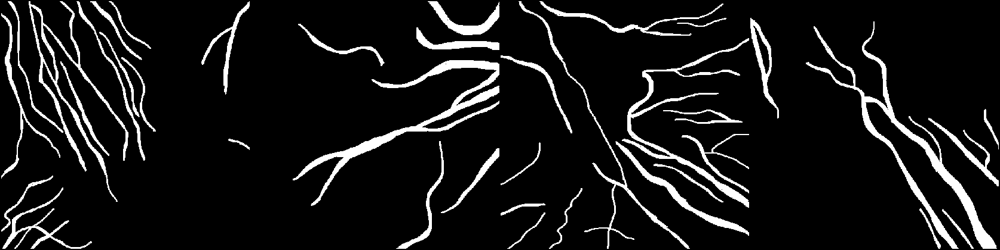

In [20]:
TF.to_pil_image(torchvision.utils.make_grid(masks[0][:4].unsqueeze(1).expand(4, 3, 416, 416)))

In [21]:
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score
def calc_metric(labels, preds):
    accuracy = np.mean(np.equal(labels,preds))
    right = np.sum(labels *preds == 1)
    precision = right / np.sum(preds)
    recall = right / np.sum(labels)
    f1 = 2 * precision*recall/(precision+recall)

    
    y_pred = preds
    y_true = labels
    """ Ground truth """
    #y_true = y_true.cpu().numpy()
    y_true = y_true > 0.5
    y_true = y_true.astype(np.uint8)
    y_true = y_true.reshape(-1)

    """ Prediction """
    #y_pred = y_pred.cpu().numpy()
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.uint8)
    y_pred = y_pred.reshape(-1)

    score_jaccard = jaccard_score(y_true, y_pred)
    score_f1 = f1_score(y_true, y_pred)
    score_recall = recall_score(y_true, y_pred)
    score_precision = precision_score(y_true, y_pred)
    score_acc = accuracy_score(y_true, y_pred)
    print('jaccard, f1, recall, precision, acc')
    print(score_jaccard, score_f1, score_recall, score_precision, score_acc)
    return score_jaccard, score_f1, score_recall, score_precision, score_acc

# Train

Using 2 GPUs.
flip+rotate+coslr_b32_e300_js_220922_15:14
../model/vessel_PFNet_flip+rotate+coslr_b32_e300_220922_15:14.pt
Training 300 epochs.


100%|██████████| 42/42 [01:33<00:00,  2.24s/it, Epoch=0, Loss=7.950434, Mean Loss=8.798866, lr=0.000100] 


Testing...
jaccard, f1, recall, precision, acc
0.24771670623167275 0.3970720356543457 0.32975811983357284 0.49891643981392825 0.9186076867082673
Model Saved


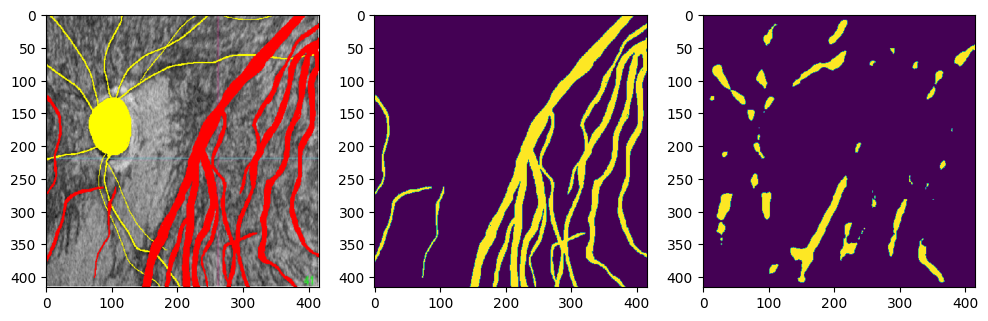

100%|██████████| 42/42 [01:32<00:00,  2.21s/it, Epoch=10, Loss=5.682434, Mean Loss=5.963926, lr=0.009701]


Testing...
jaccard, f1, recall, precision, acc
0.3537919211695874 0.5226680934303913 0.46250171484075764 0.6008293771969923 0.931340665107509
Model Saved


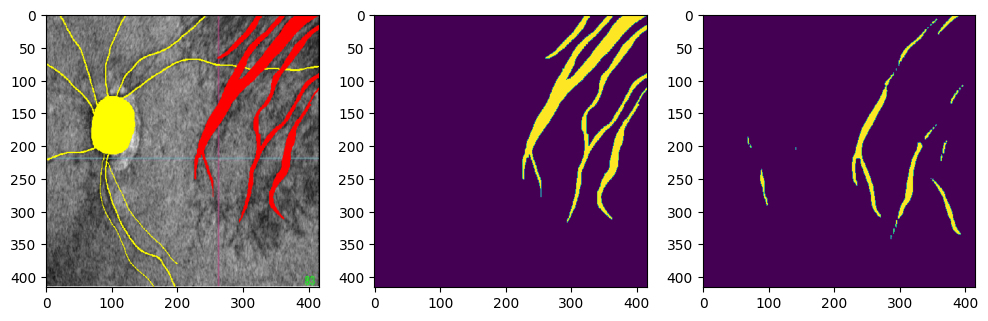

100%|██████████| 42/42 [01:29<00:00,  2.14s/it, Epoch=20, Loss=5.552019, Mean Loss=5.707636, lr=0.007525]


Testing...
jaccard, f1, recall, precision, acc
0.36656492864767176 0.5364764175682715 0.4823351875309798 0.6043089794828662 0.9322573918920327
Model Saved


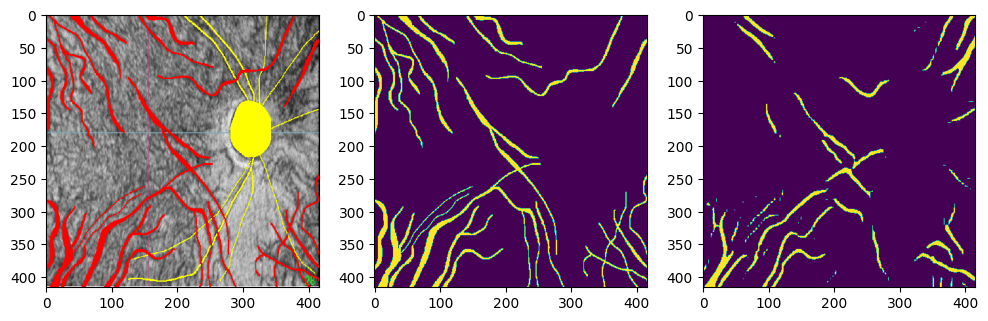

100%|██████████| 42/42 [01:30<00:00,  2.15s/it, Epoch=30, Loss=5.075743, Mean Loss=5.494778, lr=0.004190]


Testing...
jaccard, f1, recall, precision, acc
0.41718085862175525 0.5887475209444677 0.541560229713559 0.6449427504356892 0.9385080918201517
Model Saved


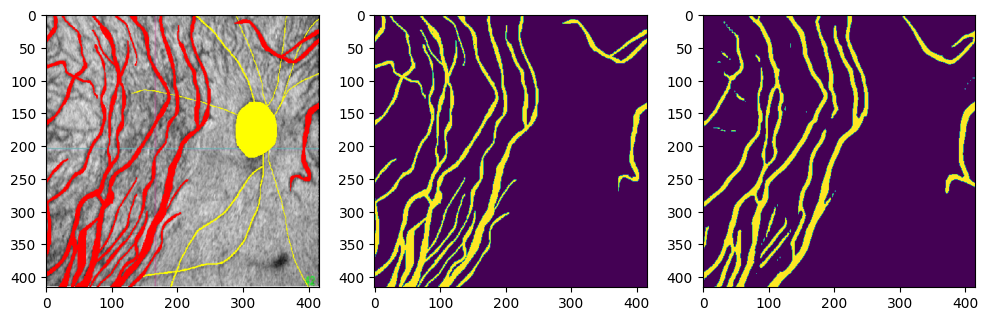

100%|██████████| 42/42 [01:27<00:00,  2.09s/it, Epoch=40, Loss=5.242788, Mean Loss=5.136078, lr=0.001258]


Testing...
jaccard, f1, recall, precision, acc
0.4462213266629474 0.6170858062127619 0.6123891111367016 0.6218551003341761 0.9382303505760897
Model Saved


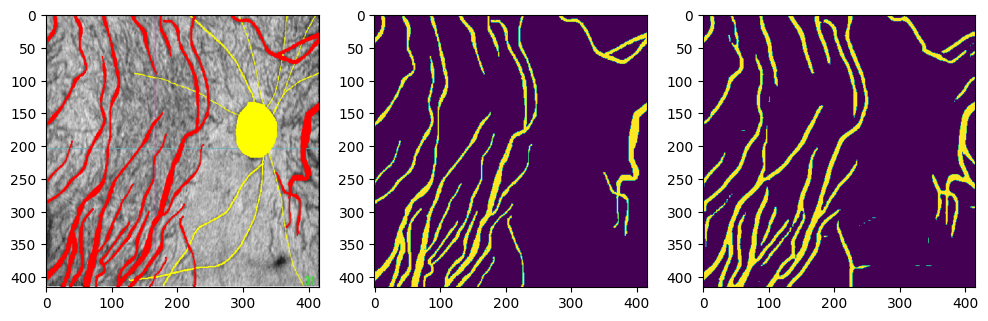

100%|██████████| 42/42 [01:24<00:00,  2.01s/it, Epoch=50, Loss=5.111738, Mean Loss=4.814692, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.44632241357706715 0.6171824613755594 0.6163549244719041 0.6180122234192842 0.9378557588132345
Model Saved


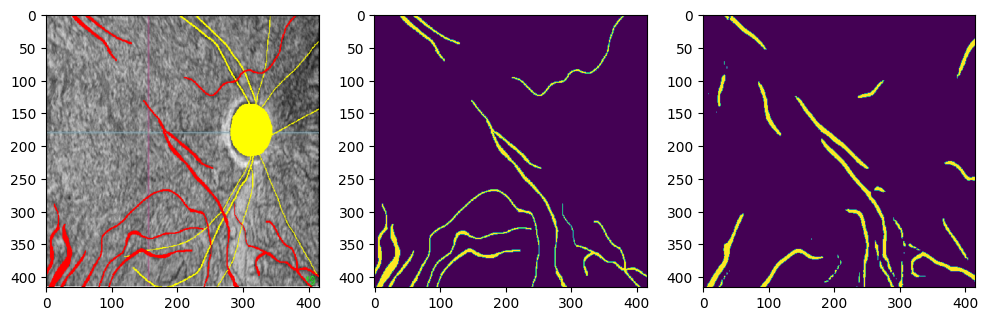

100%|██████████| 42/42 [02:22<00:00,  3.39s/it, Epoch=60, Loss=5.110925, Mean Loss=5.381715, lr=0.004852]


Testing...
jaccard, f1, recall, precision, acc
0.31944367980519434 0.484209647890932 0.43344825687062843 0.5484374996040566 0.9249468705725478


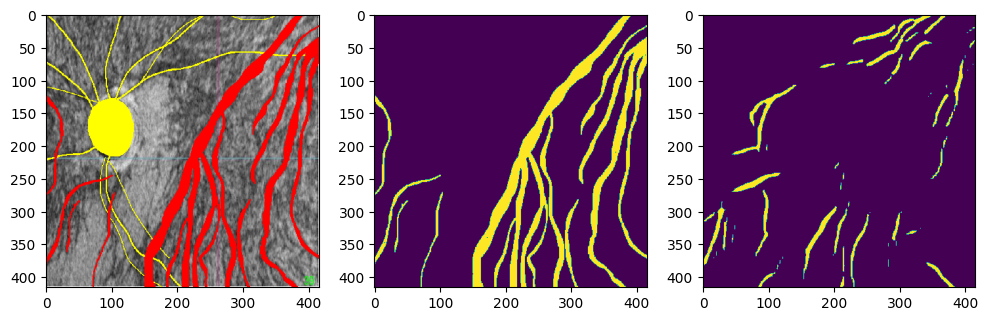

100%|██████████| 42/42 [01:32<00:00,  2.19s/it, Epoch=70, Loss=4.651525, Mean Loss=5.361994, lr=0.003775]


Testing...
jaccard, f1, recall, precision, acc
0.396263698430968 0.5676058166895892 0.47624267124625114 0.7023447396720784 0.9410270191786816


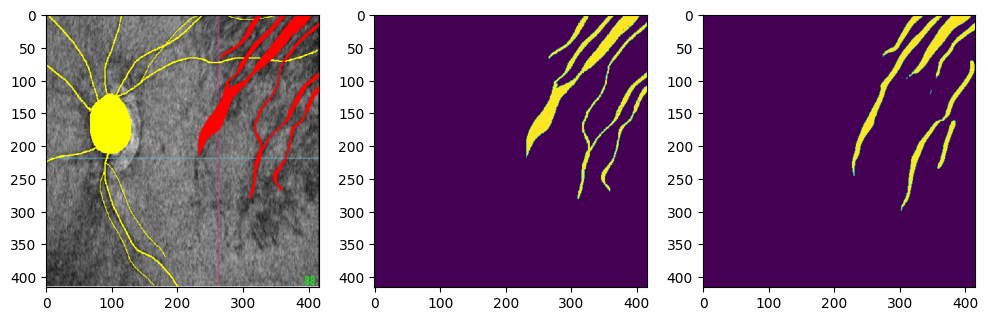

100%|██████████| 42/42 [01:59<00:00,  2.85s/it, Epoch=80, Loss=5.356551, Mean Loss=5.151467, lr=0.002125]


Testing...
jaccard, f1, recall, precision, acc
0.4104691822983391 0.5820321173263574 0.529448296925303 0.6462127678713728 0.9381967540263771


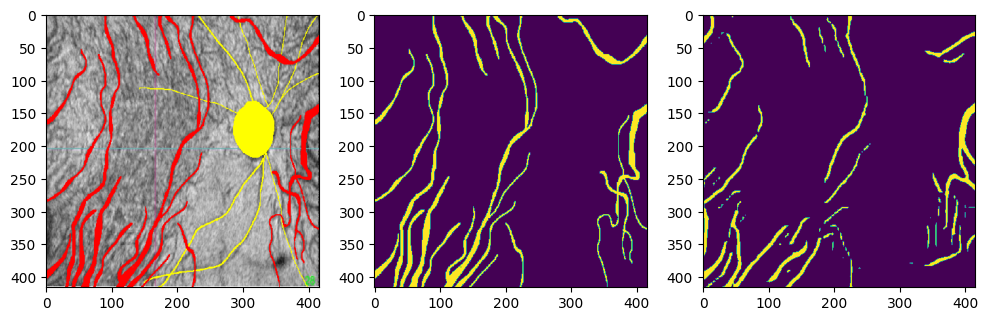

100%|██████████| 42/42 [02:07<00:00,  3.04s/it, Epoch=90, Loss=4.908183, Mean Loss=4.854332, lr=0.000673]


Testing...
jaccard, f1, recall, precision, acc
0.44215626356549714 0.6131877310886374 0.6301315295378191 0.597131286224021 0.9353855334298692
Model Saved


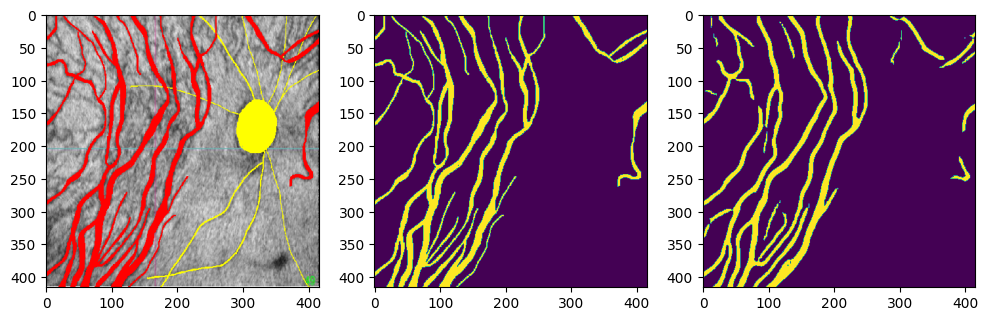

100%|██████████| 42/42 [02:10<00:00,  3.10s/it, Epoch=100, Loss=5.382614, Mean Loss=4.668999, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.44143080125317863 0.6124897579119291 0.616121205445433 0.6089008673925023 0.93663604454017


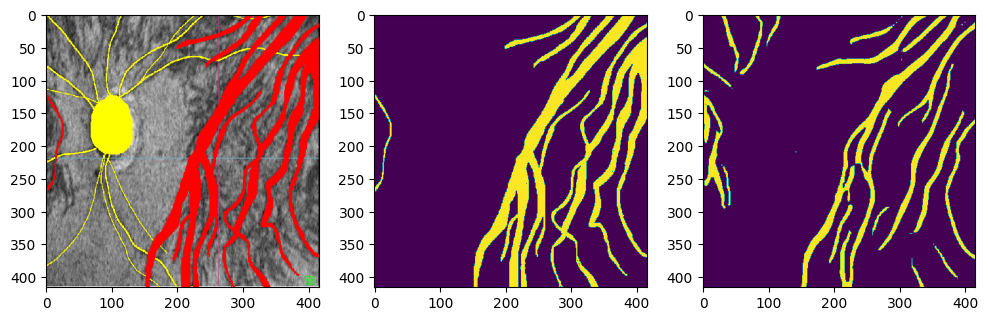

100%|██████████| 42/42 [02:11<00:00,  3.13s/it, Epoch=110, Loss=5.408988, Mean Loss=5.117420, lr=0.002428]


Testing...
jaccard, f1, recall, precision, acc
0.4257136218939365 0.5971937356233057 0.648790398894491 0.5531991992460358 0.928866012271856
Model Saved


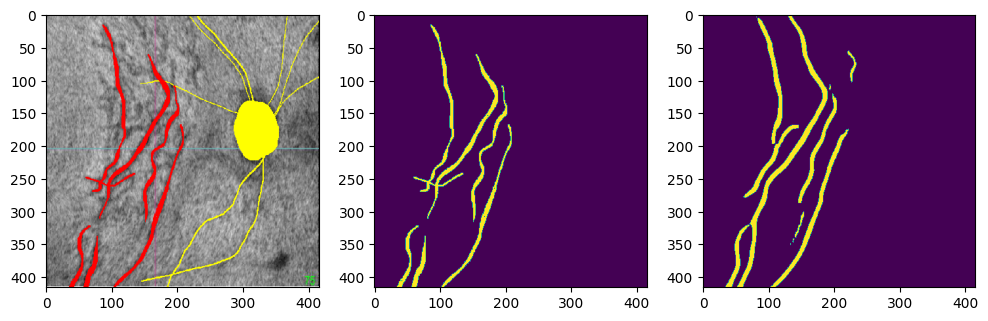

100%|██████████| 42/42 [02:20<00:00,  3.35s/it, Epoch=120, Loss=5.145714, Mean Loss=4.996833, lr=0.001900]


Testing...
jaccard, f1, recall, precision, acc
0.39253508944839943 0.5637704822273275 0.4977267970780115 0.6500223628217434 0.9373969477925244


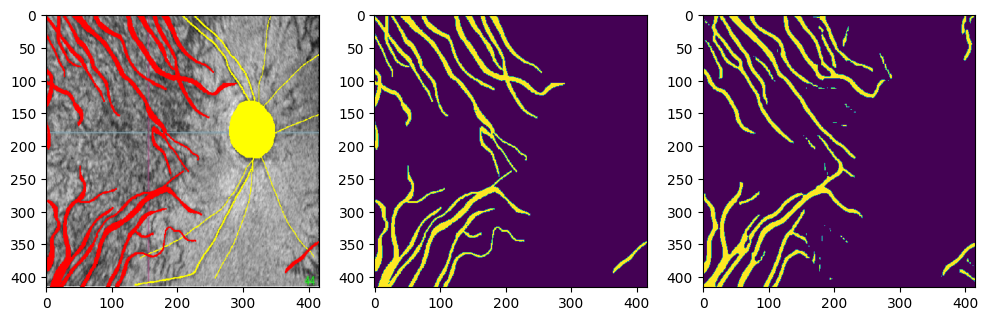

100%|██████████| 42/42 [02:06<00:00,  3.01s/it, Epoch=130, Loss=5.280837, Mean Loss=4.855273, lr=0.001092]


Testing...
jaccard, f1, recall, precision, acc
0.43231452398261866 0.6036586472369876 0.5562877327552108 0.659848305600929 0.9406297041680557


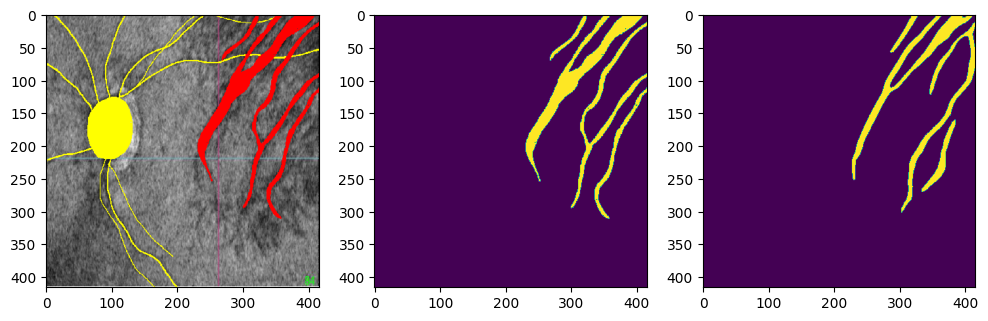

100%|██████████| 42/42 [02:08<00:00,  3.05s/it, Epoch=140, Loss=4.421590, Mean Loss=4.602640, lr=0.000381]


Testing...
jaccard, f1, recall, precision, acc
0.4273585271624515 0.5988103465665745 0.611154425791205 0.5869550457132734 0.9334415563276106


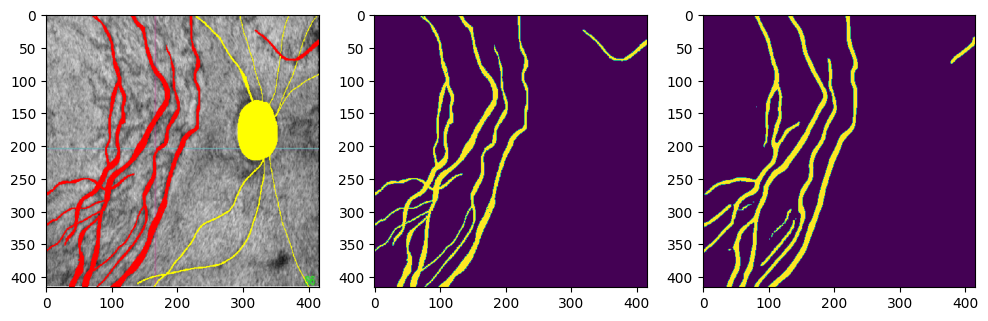

100%|██████████| 42/42 [02:07<00:00,  3.03s/it, Epoch=150, Loss=4.518140, Mean Loss=4.469259, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.42819755823633565 0.5996335111580946 0.607876952039534 0.591610658065492 0.9340250196630969


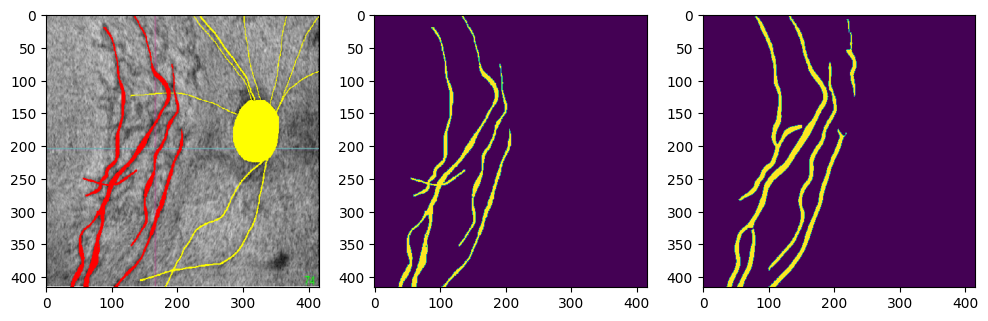

100%|██████████| 42/42 [01:35<00:00,  2.28s/it, Epoch=160, Loss=5.054221, Mean Loss=4.812289, lr=0.001215]


Testing...
jaccard, f1, recall, precision, acc
0.41773479904092586 0.5892989285774978 0.5347619500618344 0.6562229431776933 0.9394181611488457


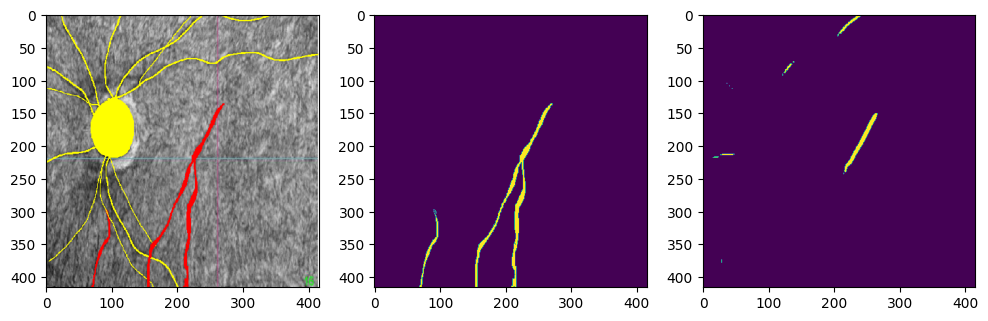

100%|██████████| 42/42 [02:10<00:00,  3.10s/it, Epoch=170, Loss=4.576471, Mean Loss=4.706828, lr=0.000963]


Testing...
jaccard, f1, recall, precision, acc
0.4321863496537026 0.60353368087638 0.6209892503266959 0.5870326086524373 0.9336897540940912


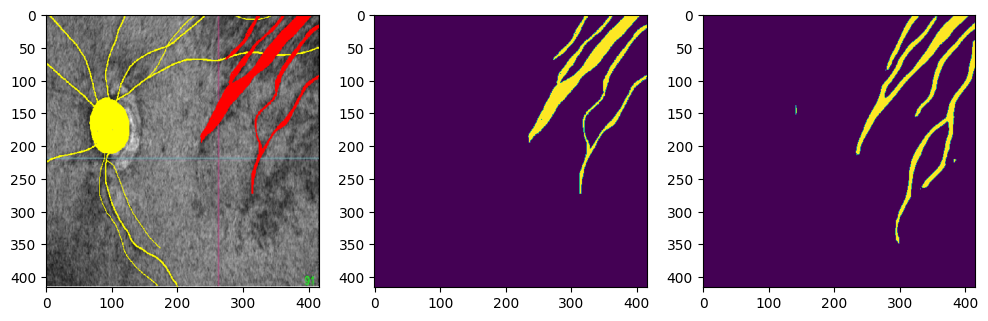

100%|██████████| 42/42 [02:08<00:00,  3.06s/it, Epoch=180, Loss=4.279312, Mean Loss=4.532065, lr=0.000575]


Testing...
jaccard, f1, recall, precision, acc
0.4195990416033251 0.5911514861681241 0.6213875940658999 0.5637213603672269 0.930141704517043


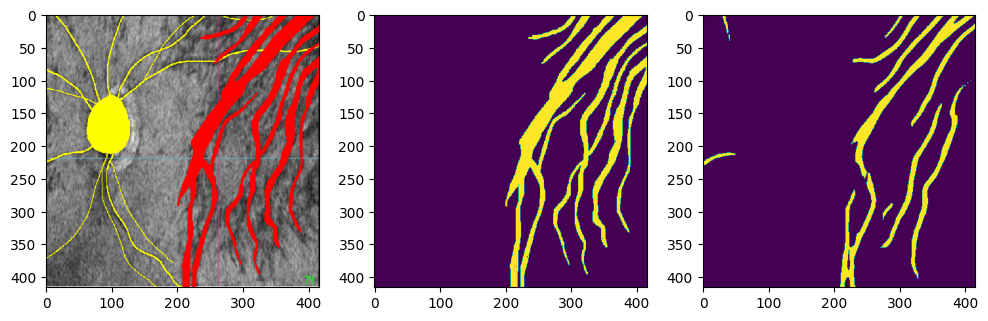

100%|██████████| 42/42 [02:15<00:00,  3.23s/it, Epoch=190, Loss=4.411881, Mean Loss=4.374695, lr=0.000235]


Testing...
jaccard, f1, recall, precision, acc
0.4253681394194524 0.5968537217237133 0.5821728659620382 0.6122941565526567 0.9360797481821401


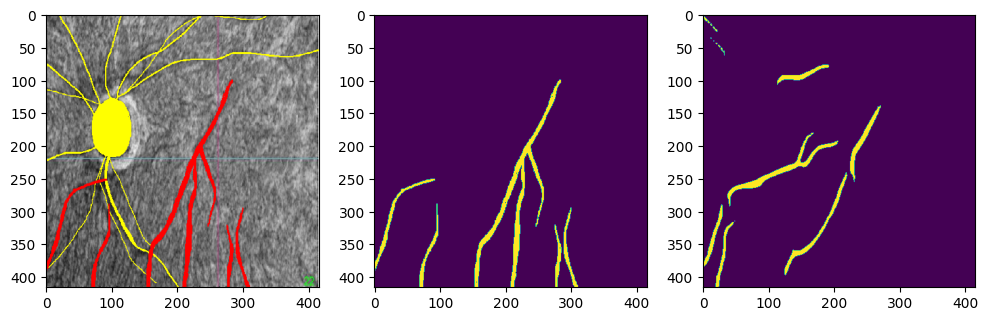

100%|██████████| 42/42 [02:07<00:00,  3.03s/it, Epoch=200, Loss=3.643602, Mean Loss=4.288419, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.41796369006679235 0.5895266472544222 0.5852769029725575 0.5938385584288015 0.9337578098956163


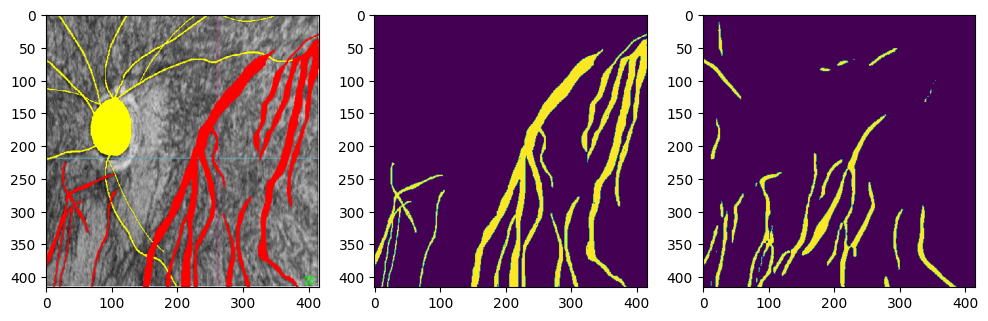

100%|██████████| 42/42 [02:02<00:00,  2.92s/it, Epoch=210, Loss=4.772811, Mean Loss=4.477160, lr=0.000609]


Testing...
jaccard, f1, recall, precision, acc
0.41535024402702897 0.5869222064006611 0.5992645961737773 0.5750779619686276 0.9314414384792483


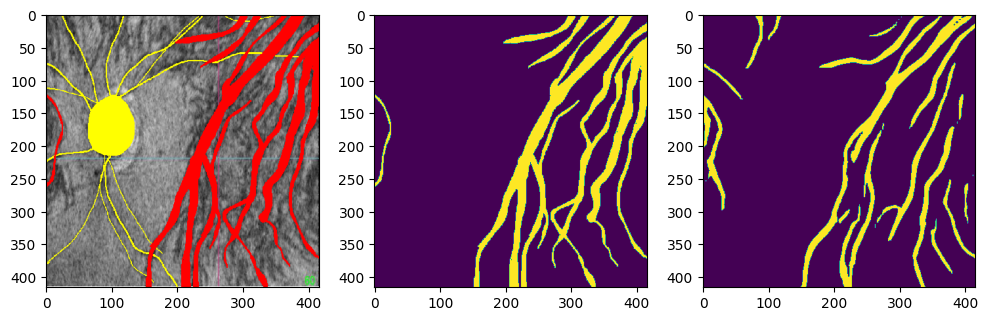

100%|██████████| 42/42 [02:07<00:00,  3.04s/it, Epoch=220, Loss=4.613733, Mean Loss=4.428454, lr=0.000494]


Testing...
jaccard, f1, recall, precision, acc
0.4208308003349271 0.5923728571139171 0.5826985835665683 0.6023737889444573 0.9348216029721227


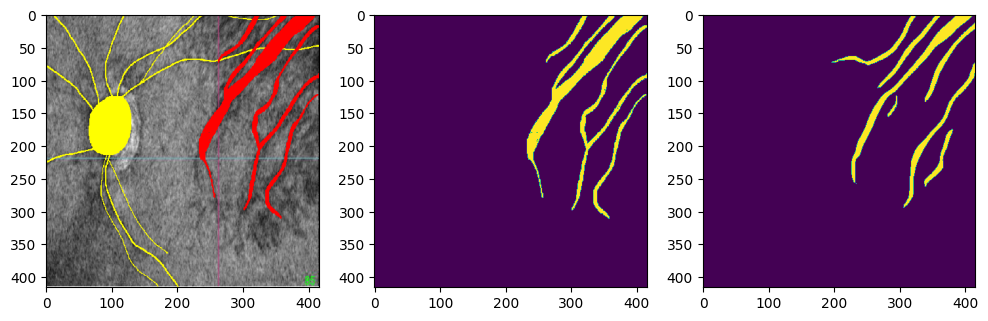

100%|██████████| 42/42 [01:37<00:00,  2.31s/it, Epoch=230, Loss=4.203708, Mean Loss=4.272701, lr=0.000317]


Testing...
jaccard, f1, recall, precision, acc
0.40469536879732726 0.5762037489221874 0.6416664747380174 0.5228614912411256 0.9232846715090841


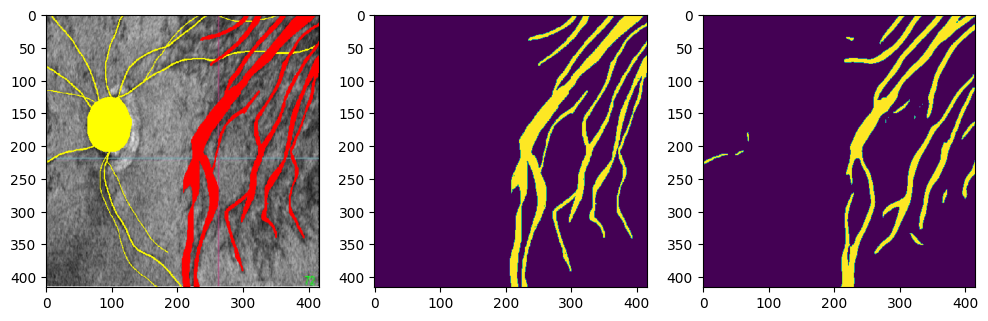

100%|██████████| 42/42 [02:06<00:00,  3.02s/it, Epoch=240, Loss=3.842269, Mean Loss=4.164670, lr=0.000161]


Testing...
jaccard, f1, recall, precision, acc
0.4145792098564648 0.5861519905958911 0.5754621057743821 0.5972465470115671 0.9339551245155846


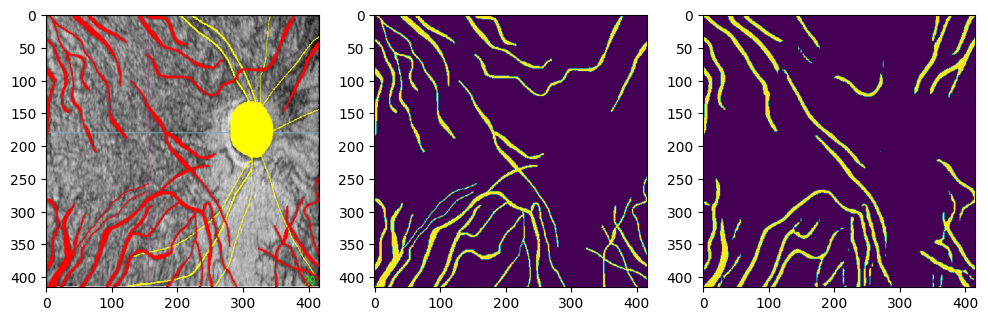

100%|██████████| 42/42 [02:08<00:00,  3.05s/it, Epoch=250, Loss=3.926700, Mean Loss=4.044565, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4066360274476536 0.5781680825927603 0.5678326916240668 0.5888866872787226 0.9326562207006834


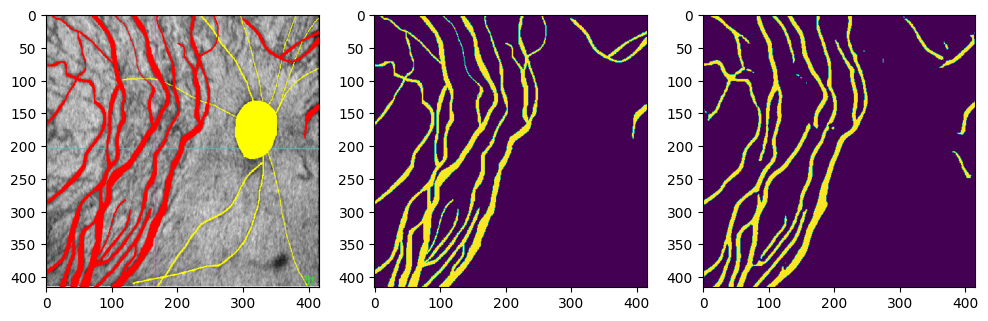

100%|██████████| 42/42 [02:07<00:00,  3.05s/it, Epoch=260, Loss=4.122650, Mean Loss=4.216155, lr=0.000306]


Testing...
jaccard, f1, recall, precision, acc
0.4007639307781866 0.5722076675054653 0.5350327196623391 0.6149343083234317 0.9349793309598716


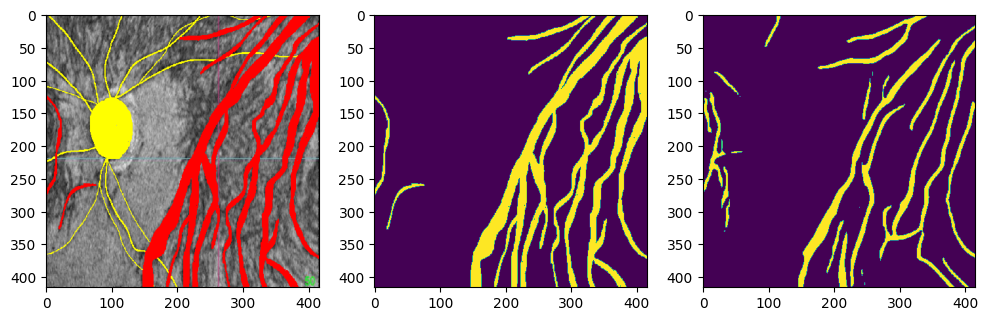

100%|██████████| 42/42 [02:13<00:00,  3.17s/it, Epoch=270, Loss=4.676557, Mean Loss=4.146070, lr=0.000259]


Testing...
jaccard, f1, recall, precision, acc
0.40447054066309185 0.5759758271214851 0.5512979216630701 0.6029665919436725 0.934027265944037


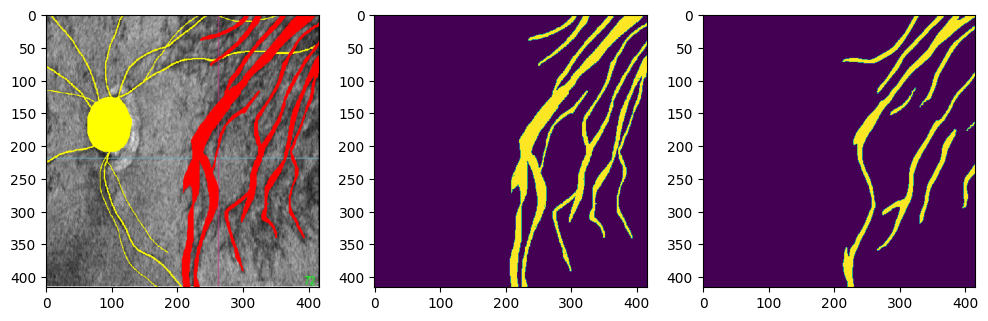

100%|██████████| 42/42 [02:06<00:00,  3.02s/it, Epoch=280, Loss=4.719591, Mean Loss=4.098896, lr=0.000188]


Testing...
jaccard, f1, recall, precision, acc
0.4013569704618267 0.5728118943591607 0.565973553901075 0.5798175034817713 0.9313887973737395


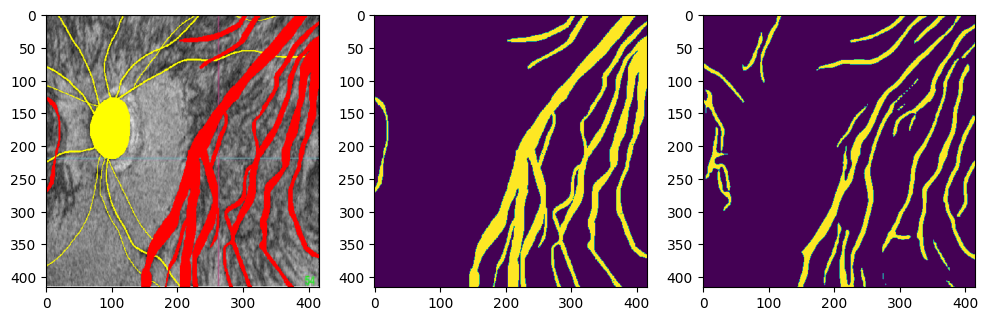

100%|██████████| 42/42 [02:12<00:00,  3.15s/it, Epoch=290, Loss=4.500274, Mean Loss=4.048169, lr=0.000125]


Testing...
jaccard, f1, recall, precision, acc
0.39882435543748657 0.5702279258824501 0.5509432375192137 0.5909116294815274 0.9325023992884823


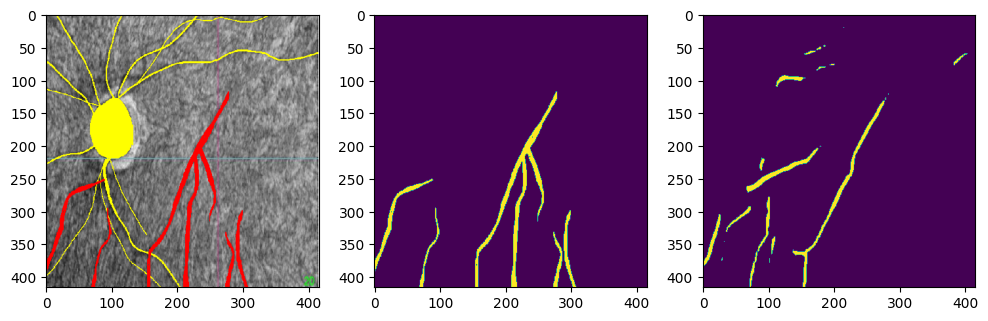

100%|██████████| 42/42 [02:11<00:00,  3.14s/it, Epoch=299, Loss=3.686183, Mean Loss=3.928571, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.40035249386142874 0.5717881685024447 0.5772601601185618 0.5664189434563813 0.9297272656835986


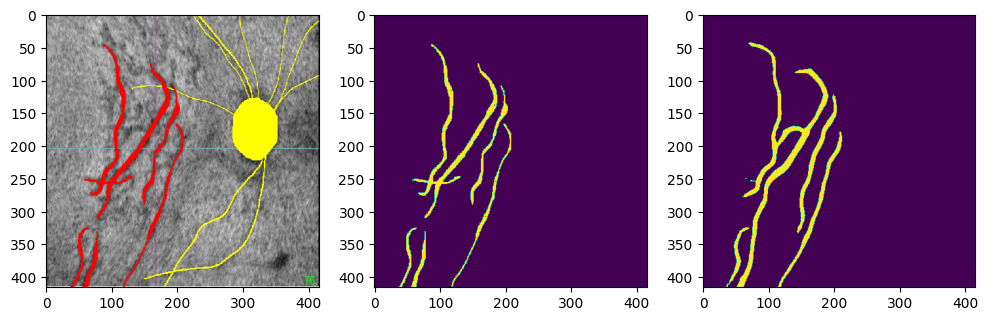

In [22]:
from tensorboardX import SummaryWriter
import datetime 

exp = 'flip+rotate+coslr'

num_epochs = args['epoch_num']
resume_epochs = args['last_epoch']
load_from = '../model/vessel_PFNet_base_b32_e500_220921_00:30.pt'


batch_size = args['train_batch_size']
scaler = torch.cuda.amp.GradScaler()
now = datetime.datetime.now()
log_name = f'{exp}_b{batch_size}_e{num_epochs}_js_'+now.strftime("%y%m%d_%H:%M")
writer = SummaryWriter(log_dir='./ckpt/PFNet/log/'+ log_name)
save_path = f'../model/vessel_PFNet_{exp}_b{batch_size}_e{num_epochs}_'+ now.strftime("%y%m%d_%H:%M") + '.pt'

if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
    net = nn.DataParallel(net)

# net.float()
net = net.to(device)
train_loss_list = []
test_acc_list = []
test_recall_list = []
test_f1_list = []
print(log_name)
print(save_path)
print(f'Training {num_epochs} epochs.')
if resume_epochs != 0:
    print(f'Resuming from epoch {resume_epochs}')
    net.load_state_dict(torch.load(load_from))
if args['amp'] == True:
    print("Using mixed precision.")

# print(data.shape, aug_masks[0].shape, aug_masks[1].shape, aft_mask.shape)
curr_iter = 1

for epoch in range(args['last_epoch'], args['last_epoch'] + args['epoch_num']):
    
    net.train()

    loss_1_running, loss_2_running, loss_3_running, loss_4_running, loss_running = 0, 0, 0, 0, 0
    tqdm_dataset = tqdm(train_loader)
    for batch_idx, batch in enumerate(tqdm_dataset):
        if args['poly_train']:
            base_lr = args['lr'] * (1 - float(curr_iter) / float(num_epochs)) ** args['lr_decay']
            optimizer.param_groups[0]['lr'] = 2 * base_lr
            optimizer.param_groups[1]['lr'] = 1 * base_lr

        image, masks, aft_mask, _ = batch

        labels = masks[0]
        labels = labels.unsqueeze(1)
        image, labels = image.float().to(device), labels.float().to(device)
        optimizer.zero_grad()

        # mixed precision
        if args['amp'] == True:
            with torch.cuda.amp.autocast():

                predict_1, predict_2, predict_3, predict_4 = net(image)
                
                loss_1 = bce_iou_loss(predict_1, labels)
                loss_2 = structure_loss(predict_2, labels)
                loss_3 = structure_loss(predict_3, labels)
                loss_4 = structure_loss(predict_4, labels)
                loss = 1 * loss_1 + 1 * loss_2 + 2 * loss_3 + 4 * loss_4

            scaler.scale(loss).backward()
            # nn.utils.clip_grad_norm_(net.parameters(), max_norm=10)
            scaler.step(optimizer)
            scaler.update()

        else:
            predict_1, predict_2, predict_3, predict_4 = net(image)

            loss_1 = bce_iou_loss(predict_1, labels)
            loss_2 = structure_loss(predict_2, labels)
            loss_3 = structure_loss(predict_3, labels)
            loss_4 = structure_loss(predict_4, labels)
            loss = 1 * loss_1 + 1 * loss_2 + 2 * loss_3 + 4 * loss_4
            
            loss.backward()
            # nn.utils.clip_grad_norm_(net.parameters(), max_norm=10)
            optimizer.step()
        
        loss_1_running += loss_1.item()
        loss_2_running += loss_2.item()
        loss_3_running += loss_3.item()
        loss_4_running += loss_4.item()
        loss_running += loss.item()
        
        tqdm_dataset.set_postfix({
            'Epoch': epoch,
            'Loss': '{:06f}'.format(loss.item()),
            'Mean Loss' : '{:06f}'.format(loss_running/(batch_idx+1)),
            'lr' : '{:06f}'.format(optimizer.param_groups[0]["lr"])
        })

        curr_iter += 1

    epoch_loss = loss_running / len(train_loader)
    epoch_loss_1 = loss_1_running / len(train_loader)
    epoch_loss_2 = loss_2_running / len(train_loader)
    epoch_loss_3 = loss_3_running / len(train_loader)
    epoch_loss_4 = loss_4_running / len(train_loader)

    scheduler.step()

    writer.add_scalar('loss/Train', epoch_loss, epoch)
    writer.add_scalar('learning_rate', optimizer.param_groups[0]["lr"], epoch)
    train_loss_list.append(epoch_loss)

## EVAL
    if epoch % 10 == 0 or epoch == args['epoch_num']-1 :
        print("Testing...")

        images=[]
        preds=[]
        labels=[]
        label_os = []
        urls_list = []
        net.eval()
        # tqdm_loader = tqdm(test_loader)
        with torch.no_grad():
            for idx, dd in enumerate(test_loader):

                image, masks, mask_o, urls = dd 
                
                image = image.float().to(device)
                label = masks[0].float()
                label_o = masks[1].float()
                _, _, _, pred = net(image)    

                images.append(image.cpu().detach().numpy())
                labels.append(label.numpy())
                label_os.append(label_o)
                preds.append(pred.cpu().detach().numpy())
                urls_list.append(urls)

            images= np.array(images).squeeze(1)
            preds = np.array(preds).squeeze(1)
            labels = np.array(labels)
            label_os = np.array(label_os)
            preds = np.where(preds > 0.5 , 1 , 0)
            labels = np.where(labels > 0.5 , 1 , 0)
            
            score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)
            test_acc_list.append(score_acc)
            test_recall_list.append(score_recall)
            test_f1_list.append(score_f1)
            writer.add_scalar('Accuracy/Test', score_acc, epoch)
            writer.add_scalar('F1/Test', score_f1, epoch)
            writer.add_scalar('Recall/Test', score_recall, epoch)
            writer.add_scalar('Precision/Test', score_precision, epoch)
            writer.add_scalar('Jaccard/Test', score_jaccard, epoch)

            if np.max(test_f1_list) == test_f1_list[-1] or np.max(test_recall_list) == test_recall_list[-1]:
                torch.save(net.state_dict(), save_path)
                print("Model Saved")

            randnum = np.random.randint(0, 171)
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 3, 1)  
            plt.imshow(label_os[randnum][0])
            plt.subplot(1, 3, 2)  
            plt.imshow(labels[randnum][0])
            plt.subplot(1, 3, 3)
            plt.imshow(preds[randnum][0])
            plt.tight_layout()
            plt.show()

# evaluation

In [25]:
print("Testing...")
net = PFNet(backbone_path)
load_from = '../model/vessel_PFNet_flip+rotate+coslr_b32_e300_220922_15:14.pt'
if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
    net = nn.DataParallel(net)
net.load_state_dict(torch.load(load_from))
net.to(device)

images=[]
preds=[]
labels=[]
label_os = []
urls_list = []
net.eval()
# tqdm_loader = tqdm(test_loader)
with torch.no_grad():
    for idx, dd in enumerate(tqdm(test_loader)):

        image, masks, mask_o, urls = dd 
        
        image = image.float().to(device)
        label = masks[0].float()
        label_o = masks[1].float()
        _, _, _, pred = net(image)    

        images.append(image.cpu().detach().numpy())
        labels.append(label.numpy())
        label_os.append(label_o)
        preds.append(pred.cpu().detach().numpy())
        urls_list.append(urls)

    images= np.array(images).squeeze(1)
    preds = np.array(preds).squeeze(1)
    labels = np.array(labels)
    label_os = np.array(label_os)
    preds = np.where(preds > 0.5 , 1 , 0)
    labels = np.where(labels > 0.5 , 1 , 0)
    
    score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)
    test_acc_list.append(score_acc)
    test_recall_list.append(score_recall)
    test_f1_list.append(score_f1)

Testing...
From ./backbone/resnet/resnet50-19c8e357.pth Load resnet50 Weights Succeed!
Using 2 GPUs.


100%|██████████| 355/355 [00:39<00:00,  8.94it/s]


jaccard, f1, recall, precision, acc
0.4257136218939365 0.5971937356233057 0.648790398894491 0.5531991992460358 0.928866012271856


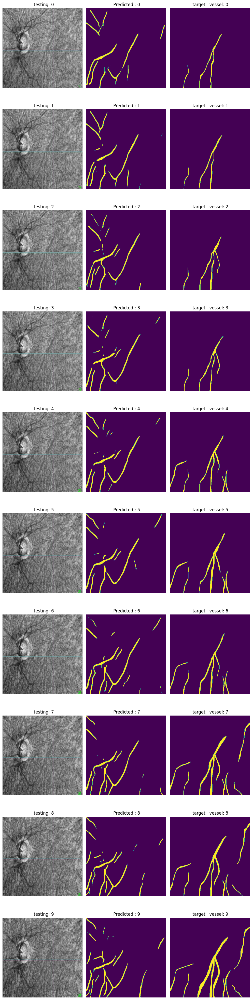

In [26]:
fig, axes = plt.subplots(10, 3, figsize = (10,40))
[c_ax.axis('off') for c_ax in axes.flatten()]

for idx, (img_ax, target_ax , mask_ax ) in zip(range(10), axes):
    
# inputs[:10] , preds[:10], targets[:10], urls_list[:10]) :
    
    image = images[idx].astype(int).transpose(1, 2, 0) # astype(int)
    img_target = preds[idx].transpose(1, 2, 0) 
    img_mask = labels[idx].transpose(1, 2, 0)  
 
    img_ax.imshow(np.clip(image, 0, 255))

    target_ax.imshow(img_target )
    mask_ax.imshow(img_mask)

    img_ax.set_title(f'  testing: {idx}')
    target_ax.set_title(f' Predicted : {idx}')
    
    mask_ax.set_title(f' target   vessel: {idx}')
plt.tight_layout()
plt.show()
 